In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pickle
import os
from pycbc.types import timeseries
from scipy.interpolate import LinearNDInterpolator
from scipy.optimize import curve_fit
from calcwf import *

In [2]:
sample_rate = 4096

# Normalised MA parameter

Write here a function that normalises the MA parameter of each grid such that interpolation can occur without worrying about the best MA to shift to. We will later then interpolate the grid to the correct chirp mass, and 'unnormalise' the MA parameter again.

In [3]:
def sine_model(x, A, B, C):
    return A*np.sin(x+B)+C

In [4]:
def normalise_MA_param(data):

    # Loop over each chirp mass grid
    for chirp in data.keys():

        # Get h0 match values and diff phase values at highest value of eccentricity in grid
        h1_single_ecc, diff_phase_single_ecc = np.array(data[chirp]['h1'][-1]), np.array(data[chirp]['diff_phase'][-1])

        # Fit a sine curve to these and find the MA at which the unmaxed match is at a minimum
        popt, pcov = curve_fit(sine_model, diff_phase_single_ecc, h1_single_ecc, p0=[0.01,0,1])
        min_MA = -np.pi/2 - popt[1] + (np.sign(popt[0])-1)*np.pi/2
        min_MA %= -2*np.pi

        # Calculate and save normalised MA parameter
        norm_MA_param = data[chirp]['diff_phase'] - min_MA
        data[chirp]['norm_MA_param'] = norm_MA_param % (-2*np.pi)

    return data

In [5]:
def normalise_MA_param_test_plot(data, h0_vmax=1.016, h1_vmin=0.8):

    # Plot setup
    plt.figure(figsize=(6.4*6,4.8*len(data.keys())))
    angle_keys = ['diff_phase', 'norm_MA_param']
    ylabels = ['MA parameter', 'Normalised MA parameter']
    norm_bools = ['unnormalised', 'normalised']
    match_keys = ['h1', 'h2', 'h2_h1']
    opt_fns = [np.max, np.min, np.min]
    vmaxs = [h0_vmax, 1, 1]
    vmins = [1, h1_vmin, h1_vmin]
    cmaps = ['inferno', 'inferno_r', 'inferno_r']
    match_names = ['h0', 'h1', 'h1/h0']

    # Loop over chirp mass grid
    for i, chirp in enumerate(data.keys()):

        # Loop over unnormalised/normalised
        for j, [angle_key, ylabel, norm_bool] in enumerate(zip(angle_keys, ylabels, norm_bools)):

            # Loop over h0, h1, h1/h0
            for k, [match_key, opt_fn, vmax, vmin, cmap, match_name] in enumerate(zip(match_keys, opt_fns, vmaxs, vmins, cmaps, match_names)):

                # Select subplot
                plt.subplot(len(data.keys()), 6, 6*i+3*j+k+1)

                # Make plot on subplot
                for match_per_MA, angle_per_MA in zip(np.array(data[chirp][match_key]).T, np.array(data[chirp][angle_key]).T):
                    plt.scatter(match_per_MA, angle_per_MA, c=opt_fn(np.array(data[chirp][match_key]), axis=1)/match_per_MA, vmax=vmax, vmin=vmin, cmap=cmap)
                plt.xlabel('Match without shift h')
                plt.ylabel(ylabel)
                plt.title('$e_{10} = 0.1$, $\mathcal{M}=$'+str(chirp)+f', {match_name}, {norm_bool}')
                plt.colorbar(label='Correction factor')

In [6]:
with open(os.path.join('grid_data', 'dataslot_3', 'all_matches'), 'rb') as fp:
        grid_data_20_30_5 = pickle.load(fp)
grid_data_20_30_5 = normalise_MA_param(grid_data_20_30_5)

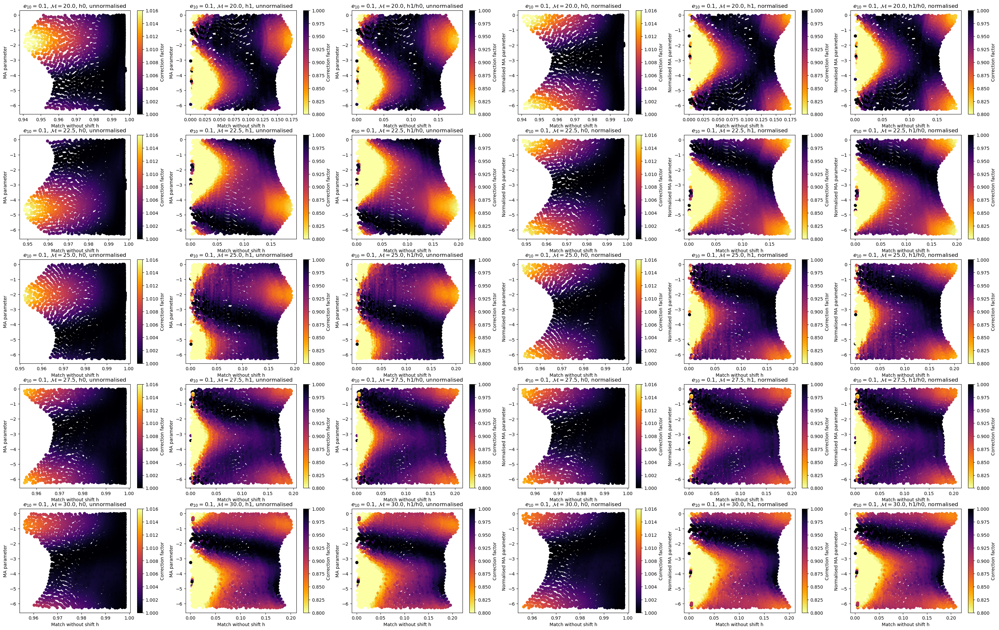

In [7]:
normalise_MA_param_test_plot(grid_data_20_30_5)
# plt.savefig('Normalise_MA_grid.png')

Seems like this works pretty well, all normalised plots seems to have standard curves which peak at 0/-2*pi in this so-called normalised MA parameter.

# 3D interpolation

Next up is to create a 3D interpolation object with parameters chirp mass, normalised MA parameter, and unmaxed match. We will create one for each of h0, h1, and h1/h0.

To plot and test results at this stage, will pick arbitrary chirp mass (within range), and create a grid by taking the points in norm MA param/unmaxed match space from one of the pre-calculated grids.

In [8]:
def create_3D_interps(data):

    # Loop over each interpolation object to create
    interp_objs = []
    for match_key, opt_fn in zip(['h1', 'h2', 'h2_h1'], [np.max, np.min, np.min]):
    
        corr_factors = []
        match_vals = []
        MA_param_vals = []
        
        # Loop over each chirp mass grid
        for chirp in data.keys():
            for i, [match_per_MA, MA_param_per_MA] in enumerate(zip(np.array(data[chirp][match_key]), np.array(data[chirp]['norm_MA_param']))):
                corr_factors.append(opt_fn(np.array(data[chirp][match_key]), axis=1)[i]/match_per_MA)
                match_vals.append(match_per_MA)
                MA_param_vals.append(MA_param_per_MA)
    
        # Flatten all arrays
        corr_factors = np.array(corr_factors).flatten()
        match_vals = np.array(match_vals).flatten()
        MA_param_vals = np.array(MA_param_vals).flatten()
    
        # Get chirp mass array of same length
        chirp_vals = np.repeat(list(data.keys()), len(match_vals)/len(data.keys()))
    
        # Create interpolation object
        interp = LinearNDInterpolator(list(zip(chirp_vals, match_vals, MA_param_vals)), corr_factors)
        interp_objs.append(interp)

    return interp_objs

In [9]:
def create_3D_interps_test_plot(interp_chirp, interps, data, true_data=None, param_chirp=25, h0_vmax=1.016, h1_vmin=0.8):

    # Plot setup
    match_keys = ['h1', 'h2', 'h2_h1']
    opt_fns = [np.max, np.min, np.min]
    vmaxs = [h0_vmax, 1, 1]
    vmins = [1, h1_vmin, h1_vmin]
    cmaps = ['inferno', 'inferno_r', 'inferno_r']
    match_names = ['h0', 'h1', 'h1/h0']
    if true_data is None:
        plot_rows = 1
    else:
        plot_rows = 2
    plt.figure(figsize=(6.4*3,4.8*plot_rows))

    # Loop over each interpolation object
    for i, interp in enumerate(interps):

        # Select subplot
        plt.subplot(plot_rows, 3, i+1)

        # Get unmaxed match and MA param values 
        if true_data is None:
            match_vals = np.array(data[param_chirp][match_keys[i]]).flatten()
            MA_param_vals = np.array(data[param_chirp]['norm_MA_param']).flatten()
        else:
            match_vals = np.array(true_data[interp_chirp][match_keys[i]]).flatten()
            MA_param_vals = np.array(true_data[interp_chirp]['norm_MA_param']).flatten()
        
        # Get interpolated correction factors
        corr_factors = interp(interp_chirp, match_vals, MA_param_vals)

        # Plot
        plt.scatter(match_vals, MA_param_vals, c=corr_factors, vmax=vmaxs[i], vmin=vmins[i], cmap=cmaps[i])
        plt.xlabel('Match without shift h')
        plt.ylabel('Normalised MA parameter')
        plt.title('$e_{10} = 0.1$, $\mathcal{M}=$'+str(interp_chirp)+f', {match_names[i]}, interpolated')
        plt.colorbar(label='Correction factor')

    # Plot true data for each interpolation object
    if true_data is not None:

        # Loop over each plot
        for i in range(3):

            # Select subplot
            plt.subplot(plot_rows, 3, i+4)

            # Make plot on subplot
            for match_per_MA, angle_per_MA in zip(np.array(true_data[interp_chirp][match_keys[i]]).T, np.array(true_data[interp_chirp]['norm_MA_param']).T):
                plt.scatter(match_per_MA, angle_per_MA, c=opt_fns[i](np.array(true_data[interp_chirp][match_keys[i]]), axis=1)/match_per_MA, vmax=vmaxs[i], vmin=vmins[i], cmap=cmaps[i])
            plt.xlabel('Match without shift h')
            plt.ylabel('Normalised MA parameter')
            plt.title('$e_{10} = 0.1$, $\mathcal{M}=$'+str(interp_chirp)+f', {match_names[i]}, calculated')
            plt.colorbar(label='Correction factor')

In [10]:
grid_data_20_30_5_interps = create_3D_interps(grid_data_20_30_5)

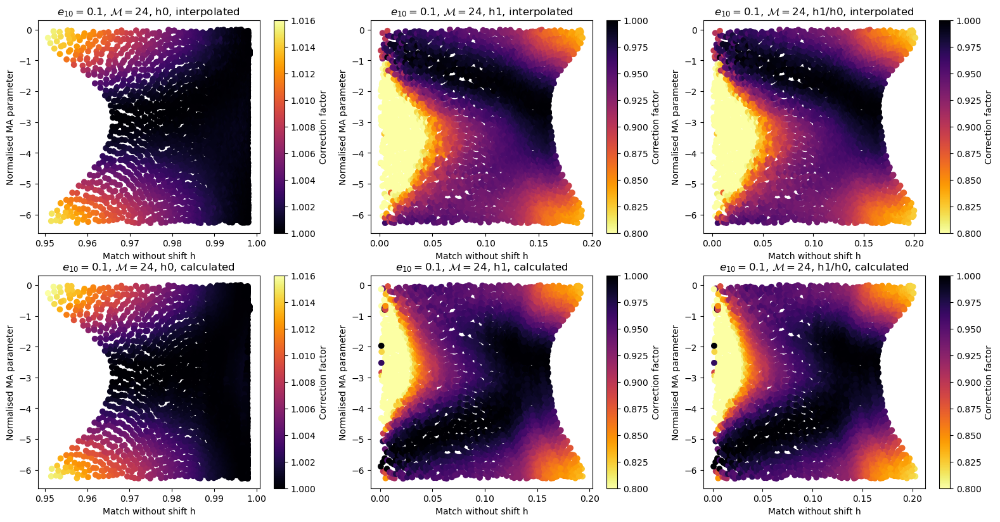

In [11]:
with open(os.path.join('grid_data', 'dataslot_4', 'all_matches'), 'rb') as fp:
    grid_data_24_25_2 = pickle.load(fp)
grid_data_24_25_2 = normalise_MA_param(grid_data_24_25_2)
create_3D_interps_test_plot(24, grid_data_20_30_5_interps, grid_data_20_30_5, true_data=grid_data_24_25_2)

h0 looks close to the true value, however some of the detail is incorrect in h1 and h1/h0, such as the position of the 'black line' in the middle. Possibly consequence of merger effects similar to the best MA to shift to? May also simply be solved by a higher resolution of chirp masses to construct the interpolation grid - intervals of 2.5 solar masses is quite high.

# Dense grid test

Will test this using a dense grid with chirp masses of (24.0, 24.1, 24.2, 24.3, 24.4, 24.5) solar masses, i.e. 25 times denser than before.

In [12]:
with open(os.path.join('grid_data', 'dataslot_5', 'all_matches'), 'rb') as fp:
        grid_data_24_24p5_6 = pickle.load(fp)
grid_data_24_24p5_6 = normalise_MA_param(grid_data_24_24p5_6)

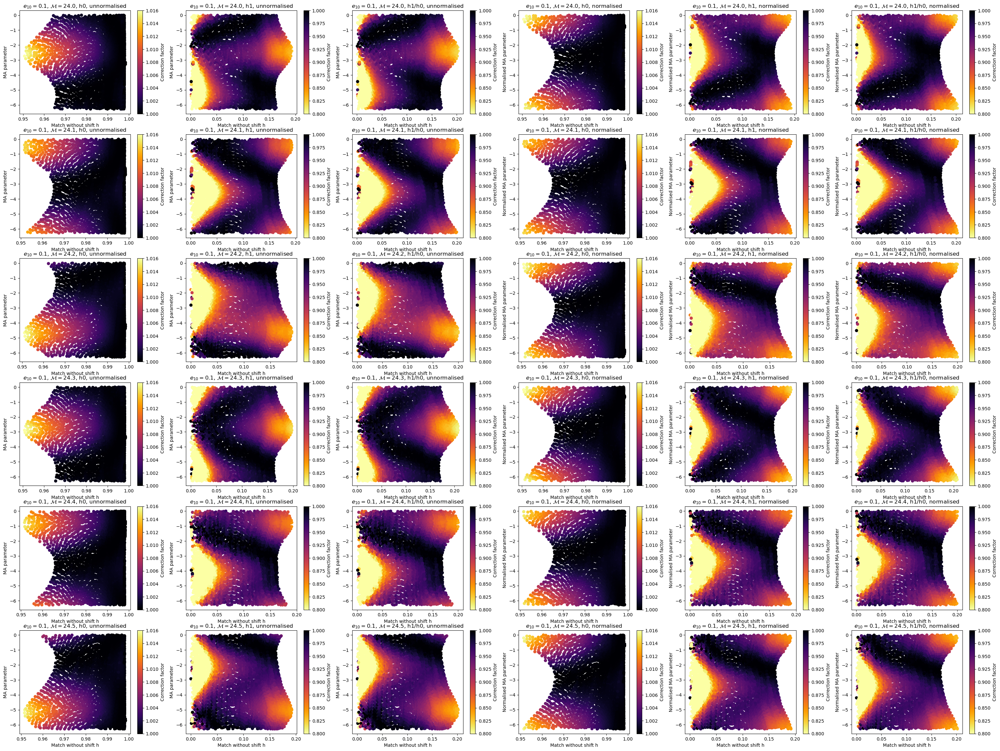

In [13]:
normalise_MA_param_test_plot(grid_data_24_24p5_6)
# plt.savefig('Normalise_MA_grid.png')

Black line(s) on h1, h1/h0 plots still seems to jump around fairly chaotically, suggesting we would require either an even denser grid or some technique to model it analytically.

In [14]:
grid_data_24_24p5_6_interps = create_3D_interps(grid_data_24_24p5_6)

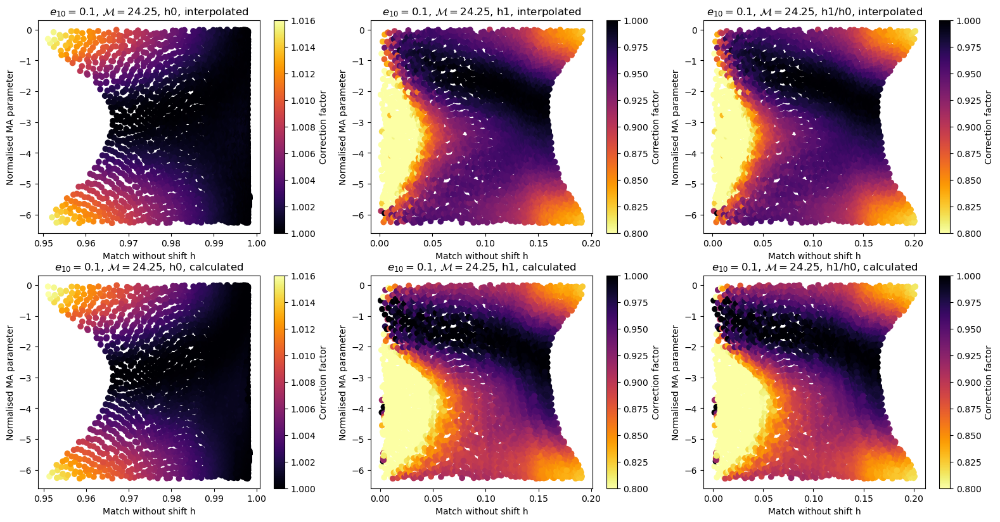

In [19]:
with open(os.path.join('grid_data', 'dataslot_6', 'all_matches'), 'rb') as fp:
    grid_data_24p25 = pickle.load(fp)
grid_data_24p25 = normalise_MA_param(grid_data_24p25)
create_3D_interps_test_plot(24.25, grid_data_24_24p5_6_interps, grid_data_24_24p5_6, true_data=grid_data_24p25, param_chirp=24.3)

Again here, clearly missing some detail in h1, h1/h0.